## Initial setup

In [1]:
from shapely.geometry import Point, Polygon, GeometryCollection, shape
from datetime import datetime
import h3.api.numpy_int as h3
import pandas as pd
import geopandas as gpd
import numpy as np
import folium
import branca
import geojson
from route3_client import Server

server = Server(hostport="127.0.0.1:7088")

def dataframe_to_geodataframe(df: pd.DataFrame, column_name: str = "h3index") -> gpd.GeoDataFrame:
    return gpd.GeoDataFrame(df,
                            geometry=[Polygon(h3.h3_to_geo_boundary(h, geo_json=True)) for h in
                                      np.nditer(df[column_name].to_numpy())],
                            crs=4326)


# test POIs - fast food shops. Can be created using the top-level justfile
fastfood_df = gpd.read_file("../data/fastfood.geojson")
del fastfood_df['@id']
print(f"Using {len(fastfood_df)} fast-food locations")

fastfood_df

Using 13694 fast-food locations


,cuisine,geometry
0,pizza,POINT (6.94125 50.91559)
1,pizza,POINT (8.67566 49.55175)
2,asian,POINT (10.27707 53.52075)
3,asian,POINT (13.31808 52.50621)
4,pizza,POINT (8.37535 49.01504)
...,...,...
13689,asian,POINT (10.66259 53.86909)
13690,pizza,POINT (13.43998 52.49952)
13691,asian,POINT (6.84493 51.51368)
13692,pizza,POINT (6.68251 50.94036)


## Create a disturbance which hinders traffic

You can use [geojson.io](http://geojson.io) to draw a featurecollection and paste it into the string bellow.

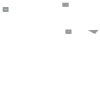

In [24]:
disturbance_geojson_string = """
{
  "type": "FeatureCollection",
  "features": [
    {
      "type": "Feature",
      "properties": {},
      "geometry": {
        "type": "Polygon",
        "coordinates": [
          [
            [
              10.909423828125,
              47.91519152713504
            ],
            [
              10.914230346679688,
              47.912660308427654
            ],
            [
              10.916633605957031,
              47.91542163178686
            ],
            [
              10.909423828125,
              47.91519152713504
            ]
          ]
        ]
      }
    },
    {
      "type": "Feature",
      "properties": {},
      "geometry": {
        "type": "Polygon",
        "coordinates": [
          [
            [
              10.871315002441406,
              47.91243019149628
            ],
            [
              10.877494812011719,
              47.91243019149628
            ],
            [
              10.877494812011719,
              47.91611193960253
            ],
            [
              10.871315002441406,
              47.91611193960253
            ],
            [
              10.871315002441406,
              47.91243019149628
            ]
          ]
        ]
      }
    },
    {
      "type": "Feature",
      "properties": {},
      "geometry": {
        "type": "Polygon",
        "coordinates": [
          [
            [
              10.866680145263672,
              47.953489853502205
            ],
            [
              10.87320327758789,
              47.953489853502205
            ],
            [
              10.87320327758789,
              47.956708840388984
            ],
            [
              10.866680145263672,
              47.956708840388984
            ],
            [
              10.866680145263672,
              47.953489853502205
            ]
          ]
        ]
      }
    },
    {
      "type": "Feature",
      "properties": {},
      "geometry": {
        "type": "Polygon",
        "coordinates": [
          [
            [
              10.776214599609375,
              47.945786463687185
            ],
            [
              10.782051086425781,
              47.945786463687185
            ],
            [
              10.782051086425781,
              47.9501556913891
            ],
            [
              10.776214599609375,
              47.9501556913891
            ],
            [
              10.776214599609375,
              47.945786463687185
            ]
          ]
        ]
      }
    }
  ]
}
"""


disturbance = GeometryCollection([shape(feature["geometry"]).buffer(0) for feature in geojson.loads(disturbance_geojson_string)["features"]])
disturbance

## Route and Analyze

In [112]:
t_start = datetime.now()
stats = server.analyze_disturbance_of_population_movement(
    disturbance, 
    15000.0, 
    fastfood_df.geometry, 
    num_destinations_to_reach=3
)
print(f"took {datetime.now() - t_start}")
print(f"id: {stats.dopm_id}")
print(f"population within disturbance: {stats.population_within_disturbance}")
geo_df = dataframe_to_geodataframe(stats.dataframe, column_name="h3index_origin")

geo_df["cost_increase"] = geo_df["avg_cost_with_disturbance"] - geo_df["avg_cost_without_disturbance"]
geo_df

took 0:00:05.376560
id: c31a61d0-291d-4ac5-81fc-a106ccf2da57
population within disturbance: 335.8131408691406


,h3index_origin,preferred_dest_h3index_without_disturbance,preferred_dest_h3index_with_disturbance,population_origin,num_reached_without_disturbance,num_reached_with_disturbance,avg_cost_without_disturbance,avg_cost_with_disturbance,geometry,cost_increase
0,622051488471023615,6.220515e+17,6.220515e+17,15.087506,3,3,421.666667,421.666667,"POLYGON ((10.94672 47.87507, 10.94645 47.87443...",0.000000
1,622051490369961983,6.220515e+17,6.220515e+17,20.655096,3,3,276.000000,276.000000,"POLYGON ((10.95066 47.79446, 10.95039 47.79381...",0.000000
2,622051490324250623,6.220515e+17,6.220515e+17,48.821136,3,3,241.000000,241.000000,"POLYGON ((10.92494 47.80621, 10.92467 47.80556...",0.000000
3,622051491303718911,6.220515e+17,6.220515e+17,34.955536,3,3,414.333333,414.333333,"POLYGON ((10.75278 47.91172, 10.75251 47.91107...",0.000000
4,622051486975721471,6.220515e+17,6.220515e+17,81.171883,3,3,279.000000,279.000000,"POLYGON ((10.89409 47.81865, 10.89382 47.81800...",0.000000
...,...,...,...,...,...,...,...,...,...,...
7801,622051488545406975,6.220515e+17,6.220515e+17,18.320543,3,3,428.333333,428.333333,"POLYGON ((10.92929 47.89797, 10.92902 47.89733...",0.000000
7802,622051492332994559,6.220517e+17,6.220517e+17,35.019188,3,3,447.000000,447.000000,"POLYGON ((10.94865 47.96095, 10.94838 47.96030...",0.000000
7803,622051492567908351,6.220515e+17,6.220515e+17,89.707382,3,3,67.666667,67.666667,"POLYGON ((10.87388 48.06431, 10.87361 48.06366...",0.000000
7804,622051487261032447,6.220515e+17,6.220515e+17,7.002126,3,3,399.666667,407.333333,"POLYGON ((10.88467 47.89279, 10.88440 47.89214...",7.666667


In [108]:
map_content_disolved = geo_df.dissolve().geometry[0].convex_hull
map_center = map_content_disolved.centroid

m = folium.Map(location=[map_center.y, map_center.x], zoom_start=11, tiles='OpenStreetMap', 
               #crs="EPSG4326"
              )

fastfood_df_subset = fastfood_df.loc[fastfood_df.geometry.within(map_content_disolved.buffer(0.8))]

folium.GeoJson(
    # use only a subset of the POIs to speed up rendering
    fastfood_df_subset,
    style_function=lambda x: {
        'fillColor': "#c00", 
        'color' : '#800',
        'weight' : 1,
        'fillOpacity' : 0.3,
    },
    ).add_to(m) 

folium.GeoJson(
    disturbance,
    style_function=lambda x: {
        'fillColor': "#c00", 
        'color' : '#800',
        'weight' : 1,
        'fillOpacity' : 0.3,
    },
    ).add_to(m)    
    

colorscale_cell_worsen = branca.colormap.LinearColormap(((1.,1.,1.), (0.0,0.0,1.0)), vmin=0.0, vmax=geo_df['cost_increase'].max()) 
   
def style_cell(feature):
    cost_inc = feature['properties']['cost_increase'] 
    if cost_inc is None:
        fill = '#f00' # no route found
    else: 
        fill = colorscale_cell_worsen(cost_inc)
    return {
        'fillColor': fill, 
        'color' : '#555',
        'weight' : 1,
        'fillOpacity' : 0.8,
    }

folium.GeoJson(
    geo_df,
    style_function=style_cell,
    tooltip=folium.features.GeoJsonTooltip([
        "h3index_origin",
        "avg_cost_without_disturbance",
        "avg_cost_with_disturbance",
        "cost_increase",
        "population_origin", 
        "preferred_dest_h3index_without_disturbance", 
        "preferred_dest_h3index_with_disturbance",
        "num_reached_without_disturbance",
        "num_reached_with_disturbance",
    ])
    ).add_to(m)    
    
m

In [86]:
#some_cells = list(geo_df[(geo_df["avg_cost_without_disturbance"] < geo_df["avg_cost_with_disturbance"])].h3index_origin)[:400]
#some_cells = list(geo_df[(geo_df["cost_increase"] == geo_df.cost_increase.min()) ].h3index_origin)[:10]
some_cells = [622051486772264959, ]
some_cells = [622051491001630719, ]
#some_cells = list(geo_df[(geo_df["cost_increase"] == 214 ) & (geo_df["avg_cost_with_disturbance"] == 885)].h3index_origin)

route_gdf = server.get_disturbance_of_population_movement_routes(stats.dopm_id, some_cells)
len(route_gdf)
route_gdf

3 3


,geometry,h3index_origin,h3index_destination,cost,with_disturbance
0,"LINESTRING (10.83316 47.97631, 10.83271 47.977...",622051491001630719,622051739309113343,400.0,1
1,"LINESTRING (10.83316 47.97631, 10.83271 47.977...",622051491001630719,622051739302035455,418.0,1
2,"LINESTRING (10.83316 47.97631, 10.83271 47.977...",622051491001630719,622051492502405119,355.0,1
3,"LINESTRING (10.83316 47.97631, 10.83271 47.977...",622051491001630719,622051739309113343,400.0,0
4,"LINESTRING (10.83316 47.97631, 10.83271 47.977...",622051491001630719,622051739302035455,418.0,0
5,"LINESTRING (10.83316 47.97631, 10.83271 47.977...",622051491001630719,622051492502405119,355.0,0


In [78]:

def style_route(feature):
    if feature['properties']['with_disturbance']:
        color = '#f00'
    else: 
        color = "#0f0"
    return { 
        'color' : color,
        'weight' : 2,
    }

folium.GeoJson(
    route_gdf, #[route_gdf['with_disturbance'] == 0],
    style_function=style_route,
    tooltip=folium.features.GeoJsonTooltip([
        "h3index_origin",
        "h3index_destination",
        "cost",
    ])
    ).add_to(m)    
    
m

## Retrieve results again using the ID

In [7]:
server.get_disturbance_of_population_movement(stats.dopm_id).dataframe.dtypes

h3index_origin                                 uint64
preferred_dest_h3index_without_disturbance    float64
preferred_dest_h3index_with_disturbance       float64
population_origin                             float64
num_reached_without_disturbance                uint64
num_reached_with_disturbance                   uint64
avg_cost_without_disturbance                  float64
avg_cost_with_disturbance                     float64
dtype: object